In [1]:
import numpy as np
import glob
import csv
from scipy.misc import imread
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import cv2
import time
from datetime import timedelta

# Calibrating the Camera


In [2]:
checkerboard_file_list = []
for name in glob.glob('/home/deep_cat/sdc-P4/camera_cal/calibration*'):
    checkerboard_file_list.append(name)
    
print(checkerboard_file_list)

['/home/deep_cat/sdc-P4/camera_cal/calibration7.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration18.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration17.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration4.png', '/home/deep_cat/sdc-P4/camera_cal/calibration19.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration20.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration12.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration1.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration8.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration11.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration15.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration2.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration6.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration9.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration10.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration5.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration13.jpg', '/home/deep_cat/sdc-P4/camera_cal/calibration16.jpg', '/home/deep_cat/sdc-P4/camera_cal/c

True /home/deep_cat/sdc-P4/camera_cal/calibration7.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration18.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration17.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration4.png
True /home/deep_cat/sdc-P4/camera_cal/calibration19.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration20.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration12.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration1.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration8.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration11.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration15.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration2.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration6.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration9.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration10.jpg
False /home/deep_cat/sdc-P4/camera_cal/calibration5.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration13.jpg
True /home/deep_cat/sdc-P4/camera_cal/calibration16.j

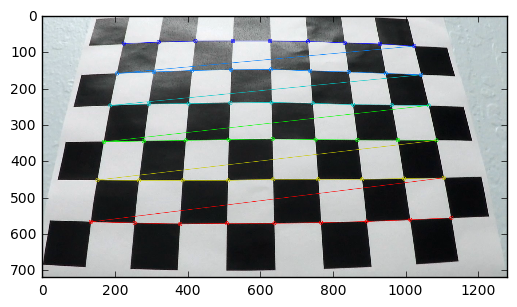

In [3]:
# this process creates the checkerboard points needed to 
# develop the calibration matrix

objpoints = []
imgpoints = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

for path in checkerboard_file_list: 
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    print(ret, path)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)


In [4]:
# this function generates the calibration matrix needed to undistort each future image from the camera

ret, mtx,dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Undistorting a test image

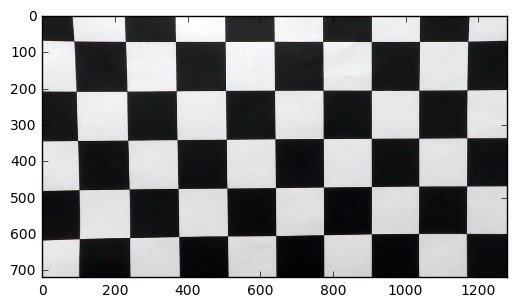

In [5]:
# going to try to undistort some of the ones that failed the previous stuff
# calibration 1 failed the original 

test_image = cv2.imread('/home/deep_cat/sdc-P4/camera_cal/calibration1.jpg')
undistorted_test_image = cv2.undistort(test_image, mtx, dist, None, mtx)
plt.imshow(undistorted_test_image)

# undistorting a car image

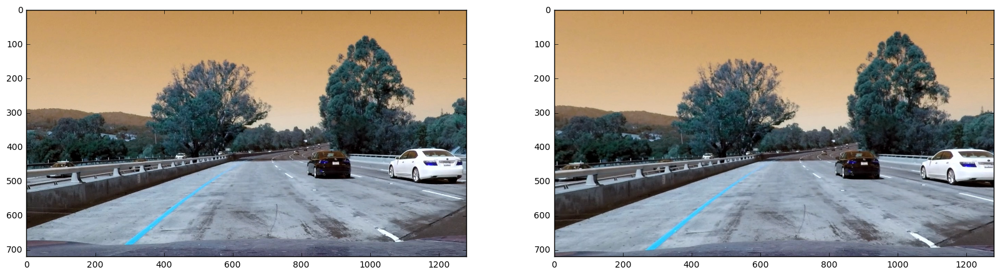

In [6]:
test1 = cv2.imread('/home/deep_cat/sdc-P4/test_images/test1.jpg')
undistorted_test1 = cv2.undistort(test1, mtx, dist, None, mtx)

f, (ax1,ax2) = plt.subplots(1,2, figsize = (20,10))
ax1.imshow(test1)
ax2.imshow(undistorted_test1)


# Gradient thresholding functions


In [7]:
# the basic functions needed

# sobel , which thresholds for the magnitude of the gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh=(0,255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    
    scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
   
    
    sx_binary = np.zeros_like(scaled_sobel_x)
    sx_binary[(scaled_sobel_x >= thresh[0]) & (scaled_sobel_x <= thresh[1])] = 1  
       
    sy_binary = np.zeros_like(scaled_sobel_y)
    sy_binary[(scaled_sobel_y >= thresh[0]) & (scaled_sobel_y <= thresh[1])] = 1  
    
    if orient == 'x': 
        return sx_binary
        
    if orient == 'y':
        return sy_binary
    
    
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 6) Create a binary mask where mag thresholds are met
    # 7) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # abs_sobel_x = np.absolute(sobel_x)
    # abs_sobel_y = np.absolute(sobel_y)
    
    # scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    # scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
    magnitude = np.sqrt((sobel_x**2) + (sobel_y**2))
    scale_factor = np.max(magnitude)/255
    magnitude=  (magnitude/scale_factor).astype(np.uint8)
    
    mag_binary= np.zeros_like(magnitude)
    mag_binary[(magnitude >= mag_thresh[0]) & (magnitude <= mag_thresh[1])] = 1  
       
   
    
    
    # binary_output = np.copy(img) # Remove this line
    return mag_binary


# thresholding the direction 

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    # Here I'm suppressing annoying error messages
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Run the function
# dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# Testing  the gradient functions on a test image



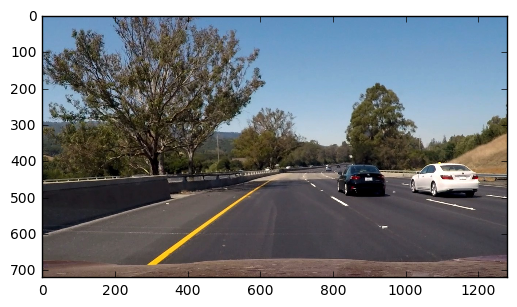

In [8]:
test6 = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test6.jpg') ## note: didn't use the cv2 import here
plt.imshow(test6)

In [9]:
# correcting the projection
test6_corrected = cv2.undistort(test6, mtx, dist, None, mtx)

In [10]:
img = test6_corrected
ksize = 3
gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20,100))
grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20,100))
mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(20,110))
dir_binary = dir_threshold(img, sobel_kernel = 15, thresh=(0.9,1.1))

In [11]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1


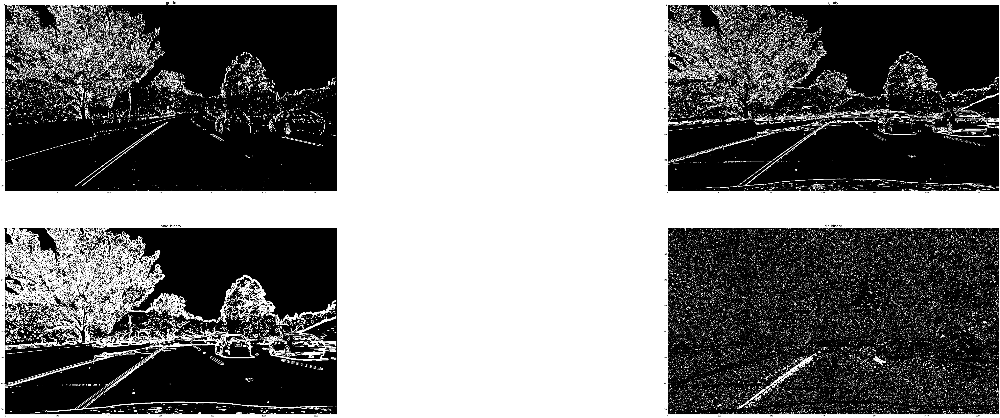

In [12]:
font_size = 20
f, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(96,36))
# f.tight_layout()
ax1.imshow(gradx, cmap='gray')
ax1.set_title('gradx', fontsize = font_size)
ax2.imshow(grady, cmap='gray')
ax2.set_title('grady', fontsize = font_size)
ax3.imshow(mag_binary, cmap='gray')
ax3.set_title('mag_binary', fontsize = font_size)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('dir_binary', fontsize = font_size)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

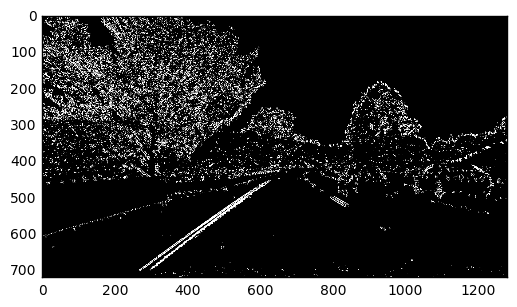

In [13]:
plt.imshow(combined, cmap='gray')

# Color thresholding

In [14]:
def hls_select(img, thresh=(0, 255)):

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output =  np.zeros_like(s)
    binary_output[(s >= thresh[0]) & (s <= thresh[1])] = 1
    return binary_output

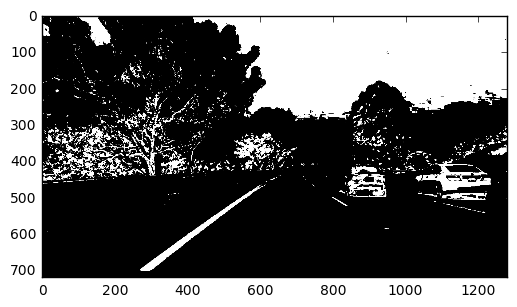

In [15]:
hls = hls_select(img, thresh = (100,255))
plt.imshow(hls, cmap='gray')

# Developing the pipeline 

In [16]:
def pipeline(img):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abssx = np.absolute(sobelx) # Absolute x derivative to accentuate strong verticalish lines
    scale_factor = np.max(abssx)/255 # Will use this to scale back to 8-bit scale
    abssx = (abssx/scale_factor).astype(np.uint8) #rescaling to 8-bit 

    # Threshold x gradient
    retval, sxbinary = cv2.threshold(abssx, 15, 150, cv2.THRESH_BINARY)
    # Threshold color channel
    retval, s_binary = cv2.threshold(s.astype('uint8'), 175, 255, cv2.THRESH_BINARY)

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary
    

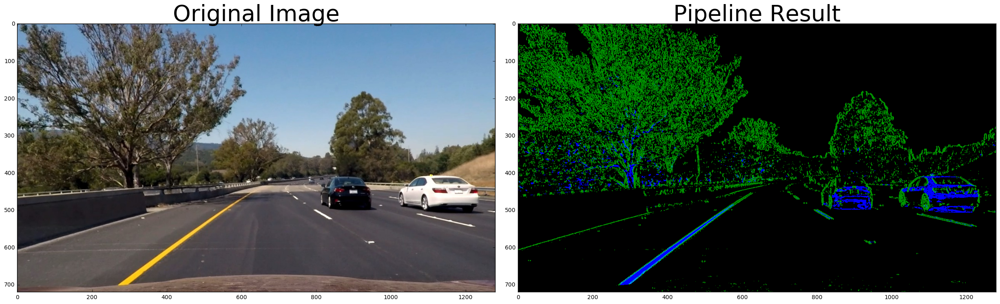

In [17]:
result = pipeline(img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Perspective transform

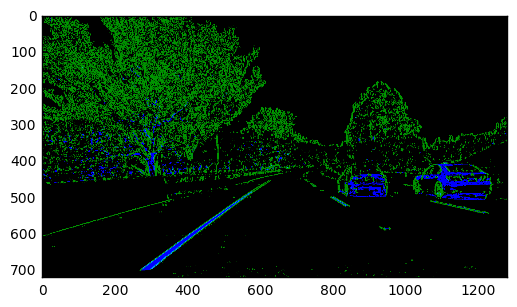

In [18]:
img = result
plt.imshow(result, cmap='gray')

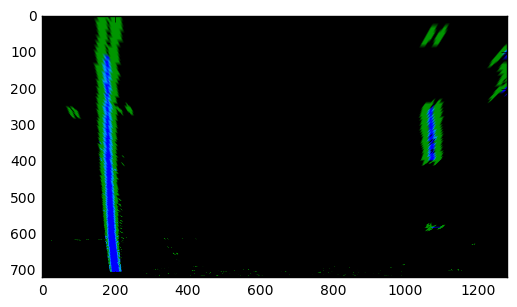

In [19]:
img_size = (img.shape[1], img.shape[0])
x_offset = 200
y_offset = 50
 # manually picked points 
src = np.float32([(588,480), (768, 481), (1060, 654), (347, 653)])                                                              
dst = np.float32([[x_offset, y_offset], 
                  [img_size[0]-x_offset, y_offset], 
                  [img_size[0]-x_offset, img_size[1]-y_offset], 
                  [x_offset, img_size[1]-y_offset]])
                   
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(img, M, img_size)

plt.imshow(warped, cmap = 'gray')

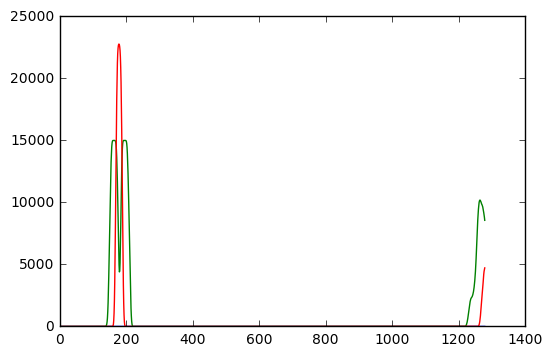

In [23]:
histogram = np.sum(warped[100:200,:], axis=0)
plt.plot(histogram)

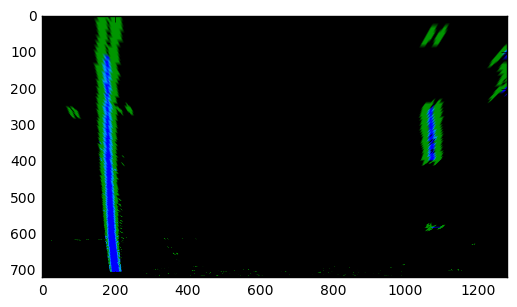

In [27]:
# identifying the lane pixels 
warped.shape[0]
# plt.imshow(img[img.shape[0]/2:,:])
plt.imshow(warped[:,:])

In [ ]:
# random notes from forum to test out
# peak = signal.find_peaks_cwt(histogram, [100], max_distances=[100]) 

# Assuming you are able to successfully detect lines with a sliding histogram 
# in the first frames. You can then use that polynomial to fit a bloated 
# polynomial ROI around the line area. Then extract the new polynomial 
# with a faster technique such as findNonZero + polyfit.

In [28]:
split = warped.shape[1]/2
r = np.argmax(histogram[split:img.shape[1]])
max_R = int(split+r)
print('max point on right line: ', max_R)


max point on right line:  640


/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


In [30]:
# sliding window algorithm 

batch = 90 # 720 / 90  = 8 sliding window 
warped.shape[1]/2
for i in range(int(warped.shape[0]/batch)):
    start = warped.shape[0] - (batch*(i+1))
    end = start + batch

    histogram = np.sum(warped[start:end,:], axis=0)

    left_start = np.argmax(histogram[0:warped.shape[1]/2])
    right_start = np.argmax(histogram[warped.shape[1]/2:warped.shape[1]])
    print('batch: ', i, start, " ", end, left_start, right_start)
#     for j in range(start,end+1):
#         print("pixel row")


batch:  0 630   720 581 1060
batch:  1 540   630 554 1261
batch:  2 450   540 545 0
batch:  3 360   450 536 1280
batch:  4 270   360 536 1289
batch:  5 180   270 539 1354
batch:  6 90   180 536 1882
batch:  7 0   90 493 1285


/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [31]:
yvals = []
xvals = []
k = 350
# img[k, :]
for z in range(1,1280):
    value = warped[k,z]
    if value == 1:
        xvals.append(z)
        yvals.append(k)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [32]:
warped

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ..., 
       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)